In [1]:
import pandas as pd
import numpy as np
import sys
sys.path.append('..')

from data_center.binance_handler import BinanceHandHandler
from backtest.performance_generater import PerformanceGenerator
from backtest.operators import *

import alphalens
import plotly.graph_objects as go

In [2]:
Open = BinanceHandHandler().get_factor_data('open').dropna()
High = BinanceHandHandler().get_factor_data('high').dropna()
Low  = BinanceHandHandler().get_factor_data('low').dropna()
Close = BinanceHandHandler().get_factor_data('close').dropna()
Volume = BinanceHandHandler().get_factor_data('volume').dropna()
Volvalue = BinanceHandHandler().get_factor_data('volvalue').dropna()
Takerbuy = BinanceHandHandler().get_factor_data('takerbuy').dropna()
Takerbuyvalue = BinanceHandHandler().get_factor_data('takerbuyvalue').dropna()

returns = Close.pct_change()
expreturn = Close.pct_change().shift(-2)
Benchmark = expreturn['BTCUSDT']
Close

,BTCUSDT,ETHUSDT,BNBUSDT,AAVEUSDT,AVAXUSDT,ETCUSDT,SOLUSDT,ADAUSDT,LINKUSDT,BCHUSDT,...,UNIUSDT,XRPUSDT,XLMUSDT,MATICUSDT,TRXUSDT,DOGEUSDT,INJUSDT,DASHUSDT,XEMUSDT,ZECUSDT
datetime,,,,,,,,,,,,,,,,,,,,,
2022-08-17,23333.1,1833.55,306.75,100.17,25.540,40.290,40.510,0.5382,8.057,133.70,...,7.958,0.3794,0.12122,0.8840,0.06825,0.08019,1.915,53.04,0.0503,74.24
2022-08-18,23185.1,1845.86,297.96,94.79,24.180,39.541,39.480,0.5115,7.644,128.97,...,7.568,0.3700,0.11575,0.8561,0.06733,0.07469,1.780,50.35,0.0486,70.08
2022-08-19,20824.9,1608.29,278.99,83.31,22.420,32.884,35.790,0.4496,6.894,114.30,...,6.889,0.3341,0.10797,0.7690,0.06398,0.06771,1.673,44.77,0.0451,62.17
2022-08-20,21127.8,1574.93,283.41,82.70,22.280,32.722,35.250,0.4502,6.893,114.47,...,6.994,0.3364,0.10886,0.7854,0.06575,0.06929,1.603,45.63,0.0451,62.96
2022-08-21,21505.6,1617.17,301.61,85.88,22.950,33.628,36.450,0.4622,7.076,119.55,...,7.205,0.3445,0.11087,0.8201,0.06584,0.06926,1.841,46.78,0.0461,64.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-19,61974.1,3161.00,507.96,109.41,53.664,27.724,169.917,0.5866,16.816,358.65,...,10.621,0.5850,0.12078,0.9324,0.11233,0.12887,35.912,32.72,0.0421,25.04
2024-03-20,67876.4,3517.80,556.99,120.25,57.077,30.620,191.916,0.6399,18.425,409.89,...,11.921,0.6112,0.13091,1.0088,0.12081,0.15223,39.166,35.80,0.0484,28.36
2024-03-21,65539.9,3495.16,554.13,123.45,53.860,30.327,179.535,0.6323,18.468,414.46,...,12.196,0.6412,0.13343,0.9963,0.12122,0.15549,37.165,35.79,0.0484,29.43


### Sharpe Factor

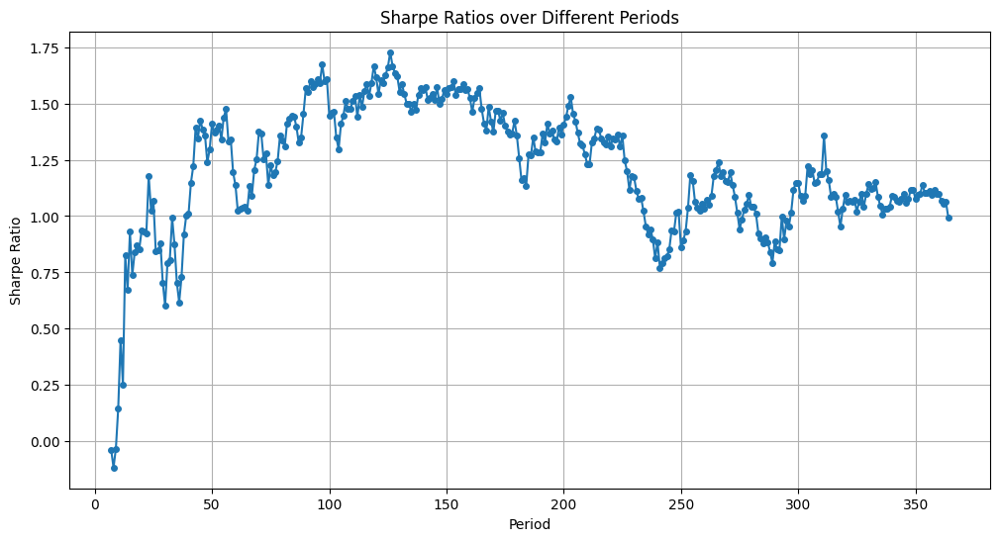

In [7]:
sharpes = []
periods = []

period_range = range(7, 365, 1)

# Iterate over all combinations of period_1 and period_2 using itertools.product
for period in period_range:
    rolling_returns = returns.rolling(window = period).mean()
    rolling_std_dev = returns.rolling(window = period).std()
    alpha_2 = rolling_returns / rolling_std_dev
    returns_by_period = PerformanceGenerator(alpha_2,
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                             ).get_returns_by_period()
    sharpe = PerformanceGenerator(alpha_2,
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                             ).get_sharpe(returns_by_period)

    sharpes.append(sharpe)
    periods.append(period)

import matplotlib.pyplot as plt

# Plot Sharpe Ratios over periods
plt.figure(figsize=(12, 6))
plt.plot(periods, sharpes, marker='o', linestyle='-', markersize=4)
plt.xlabel('Period')
plt.ylabel('Sharpe Ratio')
plt.title('Sharpe Ratios over Different Periods')
plt.grid(True)
plt.show()

In [93]:
period = 125
rolling_returns = returns.rolling(window = period).mean()
rolling_std_dev = returns.rolling(window = period).std()
sharpe_factor = rolling_returns / rolling_std_dev

returns_by_period, _ = PerformanceGenerator(factor = sharpe_factor, 
                                            expreturn = expreturn,
                                            strategy = 'SO',
                                            buy_fee = 0,#.04/100,
                                            sell_fee = 0,#.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |       -67.75 %        |       -92.82 %       |    -1.16     |    -50.88 %    |   73.17 %    |  50.30 %   | 2.63 % |  7.94 %  |
|  Benchmark  |       182.68 %        |       124.04 %       |     1.55     |    92.10 %     |   29.54 %    |  50.25 %   | 2.63 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [110]:
last_fac = sharpe_factor.rank(axis =1,pct=True)<0.2
expreturn[last_fac].mean(axis =1).dropna().cumsum().iplot()

Dropped 9.5% entries from factor data: 9.5% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to n

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-0.174998,0.093885,-0.032227,0.056289,2250,22.727273
2,-0.128978,0.131790,0.007826,0.056023,1800,18.181818
3,-0.083262,0.167255,0.034853,0.057808,1800,18.181818
4,-0.060722,0.198715,0.063540,0.058516,1800,18.181818
5,-0.009805,0.298216,0.121233,0.065721,2250,22.727273


Returns Analysis


,1D,5D,10D
Ann. alpha,0.302,0.321,0.310
beta,0.036,0.034,0.010
Mean Period Wise Return Top Quantile (bps),15.552,15.572,14.892
Mean Period Wise Return Bottom Quantile (bps),-11.761,-12.802,-13.125
Mean Period Wise Spread (bps),27.313,27.618,27.025


<Figure size 640x480 with 0 Axes>

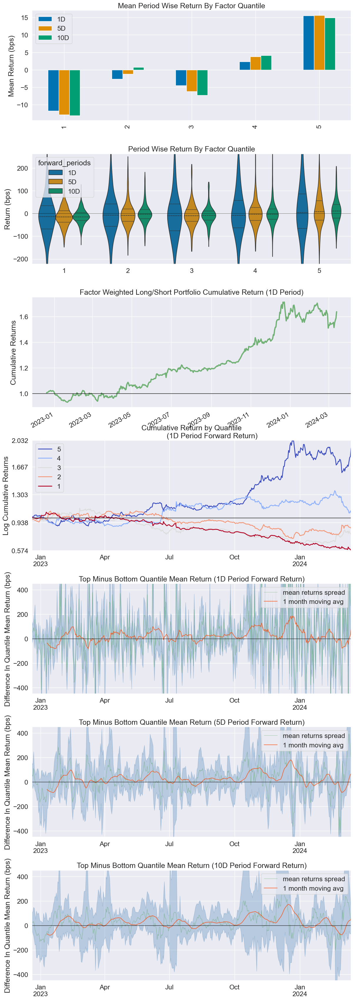

Information Analysis


,1D,5D,10D
IC Mean,0.013,0.050,0.077
IC Std.,0.286,0.295,0.283
Risk-Adjusted IC,0.045,0.171,0.272
t-stat(IC),0.948,3.618,5.770
p-value(IC),0.344,0.000,0.000
IC Skew,-0.036,-0.007,-0.023
IC Kurtosis,-0.410,-0.622,-0.659


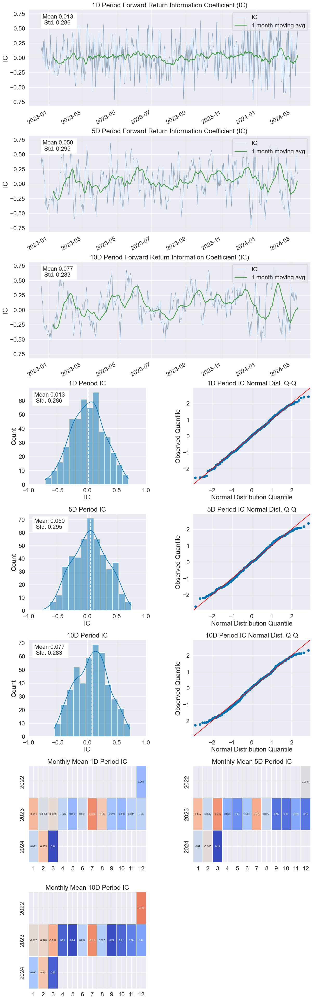

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:929: UserWarning:

Skipping return periods that aren't exact multiples of days.



Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.076,0.159,0.212
Quantile 2 Mean Turnover,0.190,0.361,0.462
Quantile 3 Mean Turnover,0.194,0.383,0.476
Quantile 4 Mean Turnover,0.158,0.330,0.418
Quantile 5 Mean Turnover,0.053,0.121,0.160


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.985,0.951,0.911


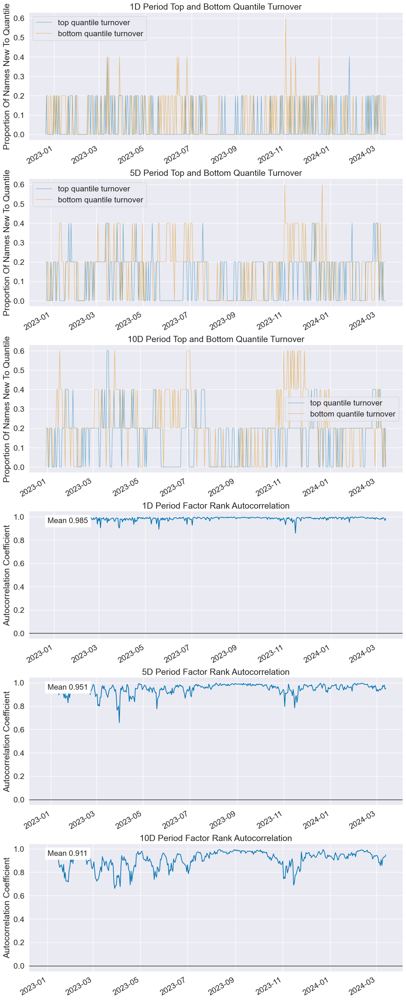

In [111]:
factor = sharpe_factor.dropna()
factor = factor.unstack().swaplevel(i=0, j=1)

factor_daily = factor.sort_index()

close_daily = Close.shift(-1)

# Ingest and format data
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor_daily,
                                                                   close_daily,
                                                                   quantiles=5)

# Run analysis
alphalens.tears.create_full_tear_sheet(factor_data)

### Momentum Factor

In [ ]:
MF = ts_pct_change(Close, 7)
returns_by_period, _ = PerformanceGenerator(factor = MF, 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        22.16 %        |       26.47 %        |     0.58     |    13.40 %     |   20.49 %    |  28.66 %   | 1.50 % | 52.07 %  |
|  Benchmark  |       182.68 %        |       124.04 %       |     1.55     |    92.10 %     |   29.54 %    |  50.25 %   | 2.63 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [130]:
del expreturn['BTCUSDT']

In [129]:
Close

,ETHUSDT,BNBUSDT,AAVEUSDT,AVAXUSDT,ETCUSDT,SOLUSDT,ADAUSDT,LINKUSDT,BCHUSDT,DOTUSDT,...,UNIUSDT,XRPUSDT,XLMUSDT,MATICUSDT,TRXUSDT,DOGEUSDT,INJUSDT,DASHUSDT,XEMUSDT,ZECUSDT
datetime,,,,,,,,,,,,,,,,,,,,,
2022-08-17,1833.55,306.75,100.17,25.540,40.290,40.510,0.5382,8.057,133.70,8.371,...,7.958,0.3794,0.12122,0.8840,0.06825,0.08019,1.915,53.04,0.0503,74.24
2022-08-18,1845.86,297.96,94.79,24.180,39.541,39.480,0.5115,7.644,128.97,8.074,...,7.568,0.3700,0.11575,0.8561,0.06733,0.07469,1.780,50.35,0.0486,70.08
2022-08-19,1608.29,278.99,83.31,22.420,32.884,35.790,0.4496,6.894,114.30,7.298,...,6.889,0.3341,0.10797,0.7690,0.06398,0.06771,1.673,44.77,0.0451,62.17
2022-08-20,1574.93,283.41,82.70,22.280,32.722,35.250,0.4502,6.893,114.47,7.218,...,6.994,0.3364,0.10886,0.7854,0.06575,0.06929,1.603,45.63,0.0451,62.96
2022-08-21,1617.17,301.61,85.88,22.950,33.628,36.450,0.4622,7.076,119.55,7.427,...,7.205,0.3445,0.11087,0.8201,0.06584,0.06926,1.841,46.78,0.0461,64.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-19,3161.00,507.96,109.41,53.664,27.724,169.917,0.5866,16.816,358.65,8.769,...,10.621,0.5850,0.12078,0.9324,0.11233,0.12887,35.912,32.72,0.0421,25.04
2024-03-20,3517.80,556.99,120.25,57.077,30.620,191.916,0.6399,18.425,409.89,9.489,...,11.921,0.6112,0.13091,1.0088,0.12081,0.15223,39.166,35.80,0.0484,28.36
2024-03-21,3495.16,554.13,123.45,53.860,30.327,179.535,0.6323,18.468,414.46,9.185,...,12.196,0.6412,0.13343,0.9963,0.12122,0.15549,37.165,35.79,0.0484,29.43


In [131]:
Close_WD = Close.resample('W-FRI').last()
factor = Close_WD.pct_change().resample('D').ffill()
factor = (factor - factor.median(axis =1).values[:,None]).abs()
returns_by_period, _ = PerformanceGenerator(factor = factor , 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        78.65 %        |       63.45 %        |     1.52     |    44.17 %     |   14.40 %    |  26.25 %   | 1.37 % | 17.07 %  |
|  Benchmark  |       210.21 %        |       132.76 %       |     1.69     |    104.14 %    |   29.54 %    |  49.64 %   | 2.60 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [133]:
rrr, _ = PerformanceGenerator(factor = factor , 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = df['eq']
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        78.65 %        |       63.45 %        |     1.52     |    44.17 %     |   14.40 %    |  26.25 %   | 1.37 % | 17.07 %  |
|  Benchmark  |        91.47 %        |       94.04 %        |     0.98     |    50.60 %     |   34.09 %    |  60.35 %   | 3.16 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [134]:
weighting = PerformanceGenerator(factor = factor , 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).weighting_by_strategy()
weighting['2023-12':'2024-01']

,ETHUSDT,BNBUSDT,AAVEUSDT,AVAXUSDT,ETCUSDT,SOLUSDT,ADAUSDT,LINKUSDT,BCHUSDT,DOTUSDT,...,UNIUSDT,XRPUSDT,XLMUSDT,MATICUSDT,TRXUSDT,DOGEUSDT,INJUSDT,DASHUSDT,XEMUSDT,ZECUSDT
datetime,,,,,,,,,,,,,,,,,,,,,
2023-12-01,-0.046385,0.007915,-0.063961,0.019799,-0.009663,0.028514,-0.028361,-0.011189,-0.026500,0.010413,...,0.023576,-0.004441,-0.062051,0.033342,-0.003109,0.085968,0.290474,-0.052968,-0.067212,-0.053124
2023-12-02,-0.046385,0.007915,-0.063961,0.019799,-0.009663,0.028514,-0.028361,-0.011189,-0.026500,0.010413,...,0.023576,-0.004441,-0.062051,0.033342,-0.003109,0.085968,0.290474,-0.052968,-0.067212,-0.053124
2023-12-03,-0.046385,0.007915,-0.063961,0.019799,-0.009663,0.028514,-0.028361,-0.011189,-0.026500,0.010413,...,0.023576,-0.004441,-0.062051,0.033342,-0.003109,0.085968,0.290474,-0.052968,-0.067212,-0.053124
2023-12-04,-0.046385,0.007915,-0.063961,0.019799,-0.009663,0.028514,-0.028361,-0.011189,-0.026500,0.010413,...,0.023576,-0.004441,-0.062051,0.033342,-0.003109,0.085968,0.290474,-0.052968,-0.067212,-0.053124
2023-12-05,-0.046385,0.007915,-0.063961,0.019799,-0.009663,0.028514,-0.028361,-0.011189,-0.026500,0.010413,...,0.023576,-0.004441,-0.062051,0.033342,-0.003109,0.085968,0.290474,-0.052968,-0.067212,-0.053124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-27,0.072437,-0.068881,-0.014190,-0.040061,-0.021026,-0.039451,-0.071883,0.153805,0.058825,-0.088440,...,-0.000166,-0.062373,0.046370,-0.013208,0.098120,0.043879,0.007240,0.012738,0.006586,-0.069487
2024-01-28,0.072437,-0.068881,-0.014190,-0.040061,-0.021026,-0.039451,-0.071883,0.153805,0.058825,-0.088440,...,-0.000166,-0.062373,0.046370,-0.013208,0.098120,0.043879,0.007240,0.012738,0.006586,-0.069487
2024-01-29,0.072437,-0.068881,-0.014190,-0.040061,-0.021026,-0.039451,-0.071883,0.153805,0.058825,-0.088440,...,-0.000166,-0.062373,0.046370,-0.013208,0.098120,0.043879,0.007240,0.012738,0.006586,-0.069487


In [136]:
weighting*expreturn['2023-12':'2024-01'].cumsum().iplot()

TypeError: unsupported operand type(s) for *: 'float' and 'NoneType'

In [ ]:
split_date = ['W-MON', 'W-TUE', 'W-WED', 'W-THU', 'W-FRI', 'W-SAT', 'W-SUN']
for date in split_date:
    print(date)
    Close_WD = Close.resample(date).last()
    MF = Close_WD.pct_change()
    expreturn_WD = Close_WD.pct_change().shift(-2)
    returns_by_period, _ = PerformanceGenerator(factor = MF, 
                                                expreturn = expreturn_WD,
                                                strategy = 'LS',
                                                buy_fee = 0.04/100,
                                                sell_fee = 0.04/100,
                                                start_time = '2020-01-01',
                                                end_time = '2024-03-19',
                                                period_of_year = 52,
                                                #benchmark = Benchmark
                                                ).backtest()

W-MON
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        6.14 %         |        9.34 %        |    0.28 %    |     3.81 %     |   20.41 %    |  20.84 %   | 2.89 % | 138.58 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-TUE
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        47.36 %        |       41.45 %        |    1.42 %    |    27.49 %     |   13.70 %    |  18.24 %   | 2.53 % | 137.46 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-WED
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        3.63 %         |        7.27 %        |    0.21 %    |     2.26 %     |   25.49 %    |  21.70 %   | 3.01 % | 139.10 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-THU
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        46.83 %        |       42.97 %        |    1.11 %    |    27.21 %     |   12.42 %    |  24.18 %   | 3.35 % | 139.64 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-FRI
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        58.64 %        |       50.36 %        |    1.37 %    |    33.52 %     |   13.76 %    |  23.02 %   | 3.19 % | 138.39 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-SAT
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        31.33 %        |       31.87 %        |    0.83 %    |    18.62 %     |   18.87 %    |  23.99 %   | 3.33 % | 136.91 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


W-SUN
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        -3.73 %        |        0.54 %        |    0.01 %    |    -2.35 %     |   21.75 %    |  23.46 %   | 3.25 % | 138.70 % |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


Dropped 3.9% entries from factor data: 3.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to n

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,0.000036,0.037356,0.005436,0.005231,2830,22.727273
2,0.004056,0.073993,0.016615,0.010500,2264,18.181818
3,0.008081,0.085728,0.028631,0.014331,2264,18.181818
4,0.014704,0.134392,0.046677,0.020650,2264,18.181818
5,0.024592,0.629366,0.114707,0.096100,2830,22.727273


Returns Analysis


,1D,5D,10D
Ann. alpha,0.279,0.261,0.226
beta,0.096,0.140,0.145
Mean Period Wise Return Top Quantile (bps),8.244,6.620,6.291
Mean Period Wise Return Bottom Quantile (bps),-11.664,-10.709,-8.494
Mean Period Wise Spread (bps),19.908,17.045,14.573


<Figure size 640x480 with 0 Axes>

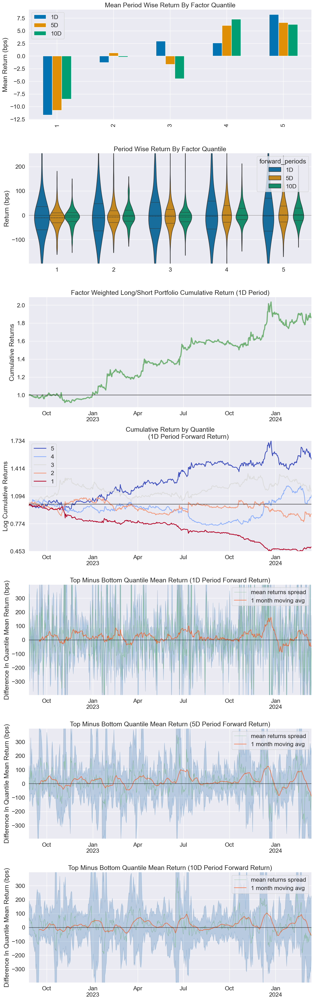

Information Analysis


,1D,5D,10D
IC Mean,-0.010,0.025,0.035
IC Std.,0.235,0.240,0.258
Risk-Adjusted IC,-0.040,0.103,0.136
t-stat(IC),-0.962,2.439,3.247
p-value(IC),0.336,0.015,0.001
IC Skew,-0.038,0.015,0.200
IC Kurtosis,-0.201,-0.219,-0.298


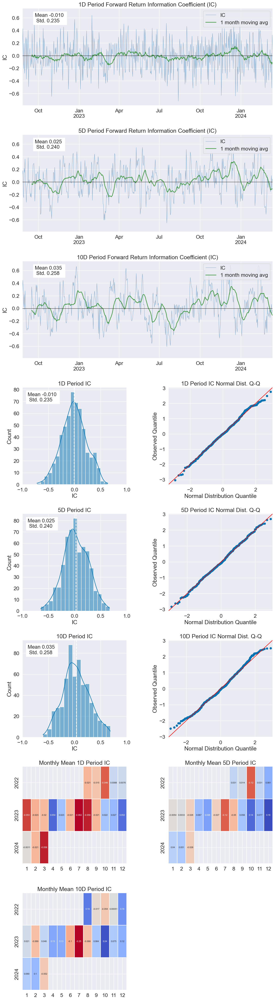

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:929: UserWarning:

Skipping return periods that aren't exact multiples of days.



Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.107,0.538,0.746
Quantile 2 Mean Turnover,0.112,0.566,0.817
Quantile 3 Mean Turnover,0.114,0.575,0.805
Quantile 4 Mean Turnover,0.114,0.575,0.804
Quantile 5 Mean Turnover,0.095,0.476,0.666


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.88,0.395,0.143


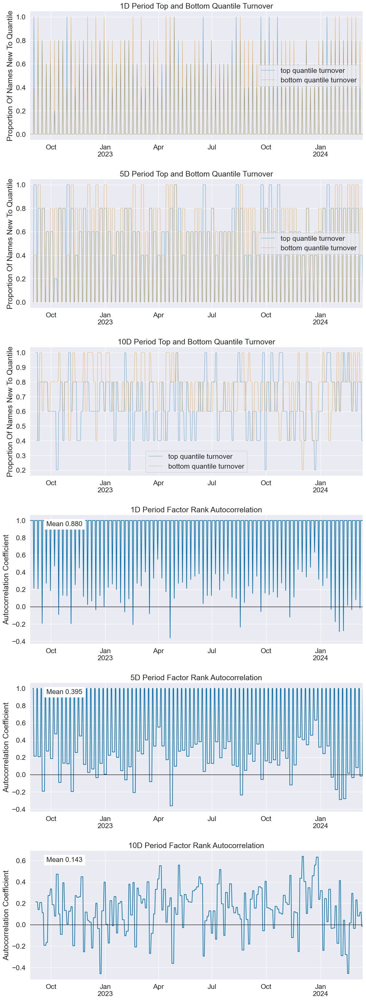

In [122]:
import alphalens

Close_WD = Close.resample('W-FRI').last()

# 把假日資料變不見做因子看看

factor = Close_WD.pct_change().resample('D').ffill()
factor = (factor - factor.median(axis =1).values[:,None]).abs()
factor = factor.unstack().swaplevel(i=0, j=1)

factor_daily = factor.sort_index()

close_daily = Close.shift(-1)

# Ingest and format data
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor_daily,
                                                                   close_daily,
                                                                   quantiles=5)

# Run analysis
alphalens.tears.create_full_tear_sheet(factor_data)

/Users/tedting/Documents/FactorTradingSystem/test/../backtest/performance_generater.py:100: RuntimeWarning:

invalid value encountered in scalar divide



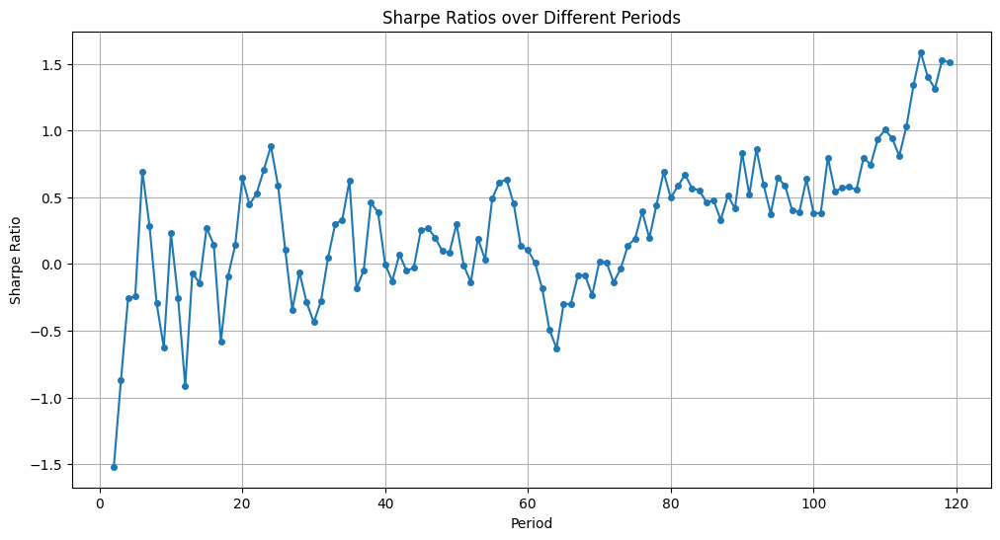

In [25]:
sharpes = []
periods = []

period_range = range(1, 120, 1)

# Iterate over all combinations of period_1 and period_2 using itertools.product
for period in period_range:
    LogRet= np.log(Close/Close.shift(1))
    R_F = LogRet.rolling(window=period).sum().dropna()
    alpha_2 = ts_rank(R_F, period)
    returns_by_period = PerformanceGenerator(alpha_2,
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                             ).get_returns_by_period()
    sharpe = PerformanceGenerator(alpha_2,
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                             ).get_sharpe(returns_by_period)

    sharpes.append(sharpe)
    periods.append(period)

import matplotlib.pyplot as plt

# Plot Sharpe Ratios over periods
plt.figure(figsize=(12, 6))
plt.plot(periods, sharpes, marker='o', linestyle='-', markersize=4)
plt.xlabel('Period')
plt.ylabel('Sharpe Ratio')
plt.title('Sharpe Ratios over Different Periods')
plt.grid(True)
plt.show()

In [23]:
LogRet= np.log(Close/Close.shift(1))
R_F = LogRet.rolling(window=50).sum().dropna()
R_F
returns_by_period, _ = PerformanceGenerator(factor = R_F, 
                                            expreturn = expreturn,
                                            strategy = 'LS',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |        63.39 %        |       53.30 %        |     1.52     |    40.14 %     |   19.44 %    |  24.06 %   | 1.26 % | 18.13 %  |
|  Benchmark  |       235.74 %        |       138.49 %       |     1.95     |    129.91 %    |   25.91 %    |  48.82 %   | 2.56 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


In [76]:
period = 125
rolling_returns = returns.rolling(window = period).mean()
rolling_std_dev = returns.rolling(window = period).std()
sharpe_factor = rolling_returns / rolling_std_dev

Close_WD = Close.resample('W-FRI').last()
fri_returns_factor = Close_WD.pct_change().resample('D').ffill()

LogRet= np.log(Close/Close.shift(1))
R_F = LogRet.rolling(window=50).sum().dropna()

Multi_alpha = sharpe_factor + fri_returns_factor + R_F
returns_by_period, _ = PerformanceGenerator(factor = Multi_alpha, 
                                            expreturn = expreturn,
                                            strategy = 'LO',
                                            buy_fee = 0.04/100,
                                            sell_fee = 0.04/100,
                                            start_time = '2020-01-01',
                                            end_time = '2024-03-19',
                                            period_of_year = 365,
                                            benchmark = Benchmark
                                            ).backtest()

+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
|             | Cumprod Total Returns | Cumsum Total Returns | Sharpe Ratio | Annualized Ret | Max Drawdown | Volatility |  STD   | Turnover |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+
| Performance |       533.04 %        |       220.12 %       |     2.06     |    218.77 %    |   34.38 %    |  67.17 %   | 3.52 % | 11.94 %  |
|  Benchmark  |       182.68 %        |       124.04 %       |     1.55     |    92.10 %     |   29.54 %    |  50.25 %   | 2.63 % |   nan    |
+-------------+-----------------------+----------------------+--------------+----------------+--------------+------------+--------+----------+


Dropped 23.9% entries from factor data: 23.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:308: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to n

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.283865,0.520520,-0.145557,0.249293,2250,22.727273
2,-0.698444,0.711121,-0.010106,0.239051,1800,18.181818
3,-0.491337,0.858677,0.076464,0.251442,1800,18.181818
4,-0.408436,1.013204,0.184502,0.269880,1800,18.181818
5,-0.275780,1.949576,0.502198,0.436831,2250,22.727273


Returns Analysis


,1D,5D,10D
Ann. alpha,0.314,0.268,0.247
beta,0.105,0.137,0.102
Mean Period Wise Return Top Quantile (bps),15.517,12.665,10.456
Mean Period Wise Return Bottom Quantile (bps),-8.842,-12.616,-13.815
Mean Period Wise Spread (bps),24.358,24.575,23.542


<Figure size 640x480 with 0 Axes>

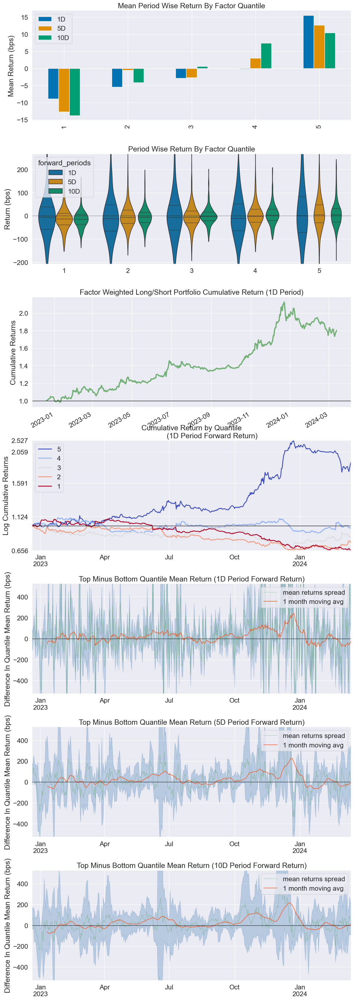

Information Analysis


,1D,5D,10D
IC Mean,-0.006,0.029,0.063
IC Std.,0.285,0.293,0.300
Risk-Adjusted IC,-0.022,0.097,0.209
t-stat(IC),-0.462,2.064,4.426
p-value(IC),0.644,0.040,0.000
IC Skew,0.114,-0.018,-0.166
IC Kurtosis,-0.499,-0.569,-0.689


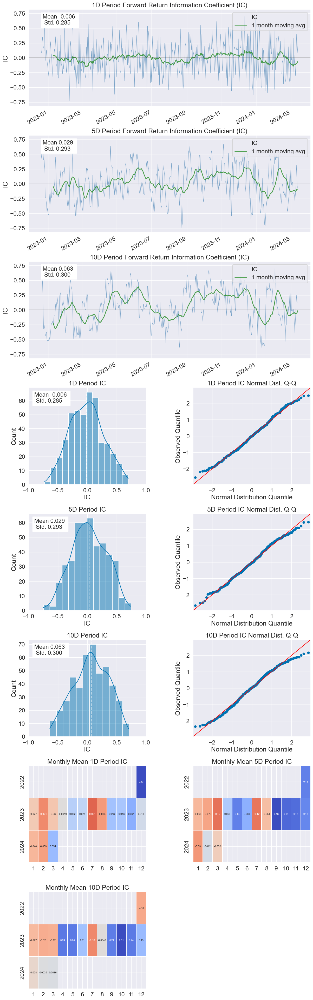

/Users/tedting/anaconda3/envs/quant311/lib/python3.11/site-packages/alphalens/utils.py:929: UserWarning:

Skipping return periods that aren't exact multiples of days.



Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.115,0.261,0.354
Quantile 2 Mean Turnover,0.303,0.544,0.649
Quantile 3 Mean Turnover,0.325,0.597,0.690
Quantile 4 Mean Turnover,0.256,0.533,0.648
Quantile 5 Mean Turnover,0.086,0.236,0.347


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.963,0.843,0.732


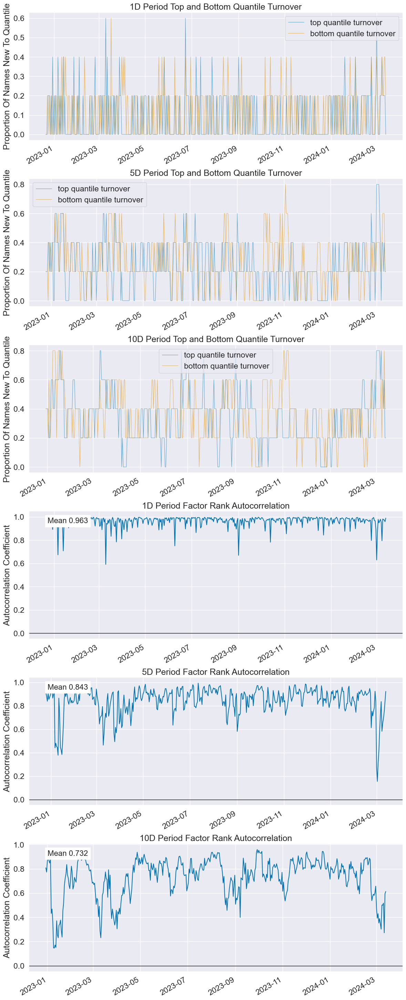

In [26]:
factor = Multi_alpha.unstack().swaplevel(i=0, j=1)

factor_daily = factor.sort_index()

close_daily = Close.shift(-1)

# Ingest and format data
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor_daily,
                                                                   close_daily,
                                                                   quantiles=5)

# Run analysis
alphalens.tears.create_full_tear_sheet(factor_data)

In [36]:
cufflinks.go_offline()

In [52]:
import cufflinks
cufflinks.go_offline()
df = returns
df['eq'] = returns.mean(axis =1)

In [80]:
df['factor'] = returns_by_period

In [86]:
(returns_by_period - df['eq']/2).cumsum().iplot()

In [81]:
df.loc['2022-12-23':].cumsum().iplot()

In [82]:
df.std()

BTCUSDT      0.026261
ETHUSDT      0.030931
BNBUSDT      0.028950
AAVEUSDT     0.042521
AVAXUSDT     0.045632
ETCUSDT      0.041614
SOLUSDT      0.058857
ADAUSDT      0.037514
LINKUSDT     0.041634
BCHUSDT      0.048225
DOTUSDT      0.035996
LTCUSDT      0.037825
UNIUSDT      0.046456
XRPUSDT      0.047193
XLMUSDT      0.041308
MATICUSDT    0.044470
TRXUSDT      0.022147
DOGEUSDT     0.046397
INJUSDT      0.061456
DASHUSDT     0.038647
XEMUSDT      0.043315
ZECUSDT      0.038248
eq           0.031789
factor       0.035158
dtype: float64

TypeError: Axes.hist() missing 1 required positional argument: 'x'

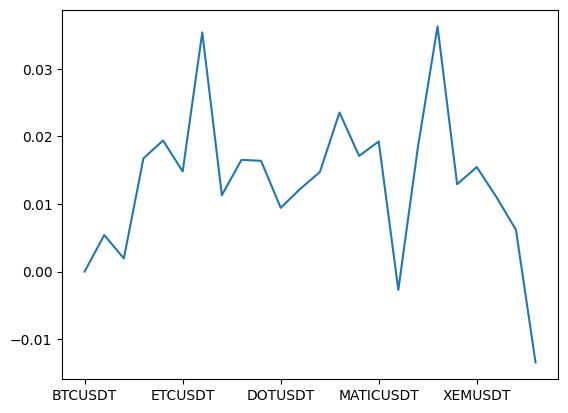

In [64]:
BTC_std = df.loc[:'2023'].std()['BTCUSDT']
(df.loc[:'2023'].std() - BTC_std).plot().hist()

In [68]:
# 假設 df 是你的 DataFrame，並且包含到2023年的數據
BTC_std = df.loc[:'2023'].std()['BTCUSDT']

# 計算每個資產相對於BTC的標準差差異
std_diff = df.loc[:'2023'].std() - BTC_std

# 繪製這些標準差差異的直方圖
std_diff.iplot(kind= 'bar')


In [69]:
# 假設 df 是你的 DataFrame，並且包含到2023年的數據
BTC_std = df.loc['2024':].std()['BTCUSDT']

# 計算每個資產相對於BTC的標準差差異
std_diff = df.loc['2024':].std() - BTC_std

# 繪製這些標準差差異的直方圖
std_diff.iplot(kind= 'bar')